In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import scipy
%matplotlib inline
%config InlineBackend.figure_format = 'svg'


In [3]:
nx = 200   #grid points in the x direction
ny = 100   # grid points in the y direction 
nu = np.float128(0.01) #KInematic viscosity 
lx = np.float128(1.0)  #Size of space in x direction 
ly = np.float128(0.5)  # size of space in y direction 
dx = np.float128(lx/nx)  #control volume sizes 
dy = np.float128(ly/ny)
dt = np.float128(0.0006) #time interval for iteration


#Reynolds number is inversely proportional to nu


In [4]:

# coefficients of pressure for the pressure eq. 
Ap = np.zeros([ny,nx])
Ae = 1.0/dx/dx*np.ones([ny,nx])
As = 1.0/dy/dy*np.ones([ny,nx])
An = 1.0/dy/dy*np.ones([ny,nx])
Aw = 1.0/dx/dx*np.ones([ny,nx])

#Pressure eq coefficients are set to 0 at the boundries. 
# left wall
Aw[:,0] = 0.0

# right wall
Ae[:,-1] = 0.0

# top north wall
An[-1,:] = 0.0

# bottom south wall
As[0,:] = 0.0

Ap = -(Aw + Ae + An + As)

#creating sparse matrix 
n = nx*ny
d0 = Ap.reshape(n)
de = Ae.reshape(n)[:-1]
dw = Aw.reshape(n)[1:]
ds = As.reshape(n)[nx:]
dn = An.reshape(n)[:-nx]
A1 = scipy.sparse.diags([d0, de, dw, dn, ds], [0, 1, -1, nx, -nx], format='csr')





In [50]:
#Initializing vector fields plus pressure. 1 ghost cell surrounding therefore n+2 grid. 

u = np.zeros([ny+2, nx+2],dtype=np.float128)
v = np.zeros([ny+2, nx+2],dtype=np.float128)
p = np.zeros([ny+2, nx+2],dtype=np.float128)

ut = np.zeros([ny+2, nx+2],dtype=np.float128)
vt = np.zeros([ny+2, nx+2],dtype=np.float128)



prhs = np.zeros_like(p)



frames = 40 #number of time iterations 

#blank arrays holding values of all the interations 
u_frames = np.zeros([ny+2,nx+2,frames],dtype=np.float128)
v_frames = np.zeros([ny+2,nx+2,frames],dtype=np.float128)




for n in range(0, frames):
    
    #boundry conditions for u 

    # left wall with inlet

    u[:,1] = 0.0 
    u[45:55,1] = 0.5
    
    

    #right wall with outlet
    u[:,-1] = 0.0
    u[45:55,-1] = 0.5
    
    

    #top wall 
    u[-1,:] =  - u[-2,:]  #u at top boundry is the average of u inside and outside of boundry 
    

    #bottom wall
    u[0,:] =  - u[1,:]
    


    #boundry conditions for v 

    #top wall 
    v[-1,:] = 0.0
    #bottom wall
    v[1,:] = 0.0

    #left wall
    v[:,0] =  - v[:,1]
    
    
    #right wall 
    v[:,-1] = - v[:,-2]
    


    #computing ut from the x equation without pressure
    for i in range(2,nx+1):
        for j in range(1,ny+1):
            ue = 0.5*(u[j,i+1] + u[j,i]) 
            uw = 0.5*(u[j,i] + u[j,i-1])
            un = 0.5*(u[j+1,i]+ u[j,i])
            us = 0.5*(u[j,i]+ u[j-1,i])

            vn = 0.5*(v[j+1, i-1] + v[j+1, i])
            vs = 0.5*(v[j, i-1]+ v[j,i])

            convection = np.float128(-(ue*ue - uw*uw)/dx - (un*vn - us*vs)/dy)
            diffusion = np.float128(nu*( ( u[j,i+1] - 2.0*u[j,i] + u[j,i-1] )/dx/dx + (u[j+1,i] - 2.0*u[j,i] + u[j-1,i])/dy/dy))

            ut[j,i] = u[j,i] + dt*(convection + diffusion)


    #computing vt from the y equation without pressure
    for i in range(1,nx+1):
        for j in range(2,ny+1):
            ve = 0.5*(v[j,i+1] + v[j,i])
            vw = 0.5*(v[j,i] + v[j,i-1])
            ue = 0.5*(u[j,i+1] + u[j-1, i+1])
            uw = 0.5*(u[j,i] + u[j-1,i])
            vn = 0.5*(v[j+1,i] + v[j,i])
            vs = 0.5*(v[j,i] + v[j-1,i])

            convection = np.float128(- (ue*ve - uw*vw)/dx - (vn*vn - vs*vs)/dy)
            
            diffusion = np.float128(nu*( ( v[j,i+1] - 2.0*v[j,i] + v[j,i-1])/dx/dx + (v[j+1,i] - 2.0*v[j,i] + v[j-1,i])/dy/dy ))

            vt[j,i] = v[j,i] + dt*(convection + diffusion)
    
    
    #compute rhs of pressure poisson eq
    for i in range(1, nx+1):
        for j in range(1, ny+1):
            prhs[j,i] = (ut[j,i+1] - ut[j,i])/dx + (vt[j+1,i] - vt[j,i])/dy

    prhs /= dt

    
    pt,info = scipy.sparse.linalg.bicg(A1,prhs[1:-1,1:-1].ravel(),tol=1e-10) #sparse linear solver
    p[1:-1,1:-1] = pt.reshape([ny,nx])

    
    
    #updating velocities with pressure correction
    u[1:-1,2:-1] = ut[1:-1,2:-1] - dt * (p[1:-1,2:-1] - p[1:-1,1:-2])/dx
    v[2:-1,1:-1] = vt[2:-1,1:-1] - dt * (p[2:-1,1:-1] - p[1:-2,1:-1])/dy
    
    #building up array of all frames. 
    u_frames[:,:,n] += u
    v_frames[:,:,n] += v
    print("frame number", n)
    







frame number 0
frame number 1
frame number 2
frame number 3
frame number 4
frame number 5
frame number 6
frame number 7
frame number 8
frame number 9
frame number 10
frame number 11
frame number 12
frame number 13
frame number 14
frame number 15
frame number 16
frame number 17
frame number 18
frame number 19
frame number 20
frame number 21
frame number 22
frame number 23
frame number 24
frame number 25
frame number 26
frame number 27
frame number 28
frame number 29
frame number 30
frame number 31
frame number 32
frame number 33
frame number 34
frame number 35
frame number 36
frame number 37
frame number 38
frame number 39


/home/raj/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Casting input data from float128 to float64 for imshow.
  fig.canvas.print_figure(bytes_io, **kw)


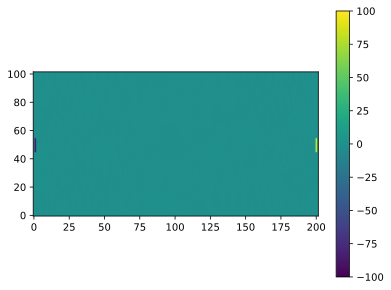

In [51]:
#compute divergence
divu = np.zeros_like(p)
for i in range(1, nx+1):
        for j in range(1, ny+1):
            divu[j,i] = (u[j,i+1] - u[j,i])/dx + (v[j+1,i] - v[j,i])/dy

plt.imshow(divu, origin ='lower')
plt.colorbar()
plt.show()

In [52]:
fig = plt.figure(figsize=[12,6],dpi=600)
plt.quiver(u,v, scale=0.1)
#plt.quiver(u_frames[:,:,50],v_frames[:,:,50])
plt.show()

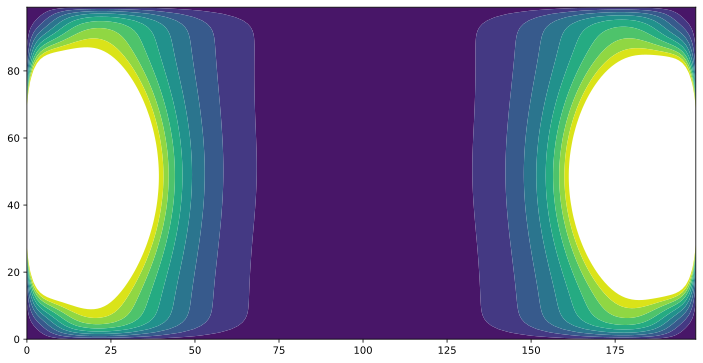

In [53]:
#Find the center velocities 
u_center = np.float128(0.5*(u[1:-1,2:] + u[1:-1,1:-1]))
v_center = np.float128(0.5*(v[2:,1:-1] + v[1:-1,1:-1]))
#calcuate the speed at center points. 
speed = np.sqrt(u_center*u_center + v_center*v_center)


fig = plt.figure(figsize=[12,6],dpi=600)
levels = np.linspace(speed.min(), 0.0001, 10)
plt.contourf(speed, levels=levels)



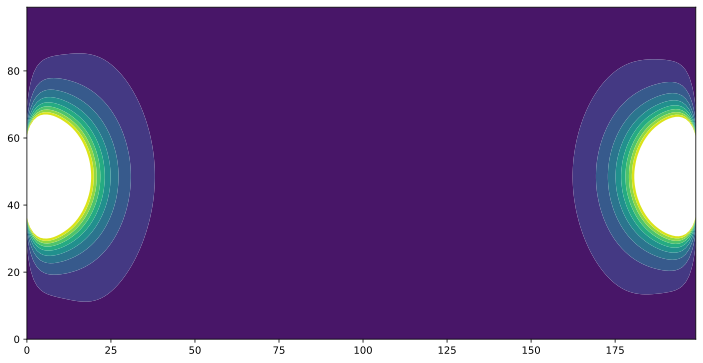

In [54]:
#Animated Contour plot
myimages = []
fig = plt.figure(figsize=[12,6],dpi=600)
for k in range(frames):

    u_center = 0.5*(u_frames[1:-1,2:,k] + u_frames[1:-1,1:-1,k])
    v_center = 0.5*(v_frames[2:,1:-1,k] + v_frames[1:-1,1:-1,k])
    speed = np.sqrt(u_center*u_center + v_center*v_center)
    levels = np.linspace(speed.min(), 0.001, 10)
    img = plt.contourf(speed,levels=levels)

    
    myimages.append([img])


anim = animation.ArtistAnimation(fig=fig, artists=myimages, interval=500)
anim.save('Contour Animation.gif') 
plt.show()

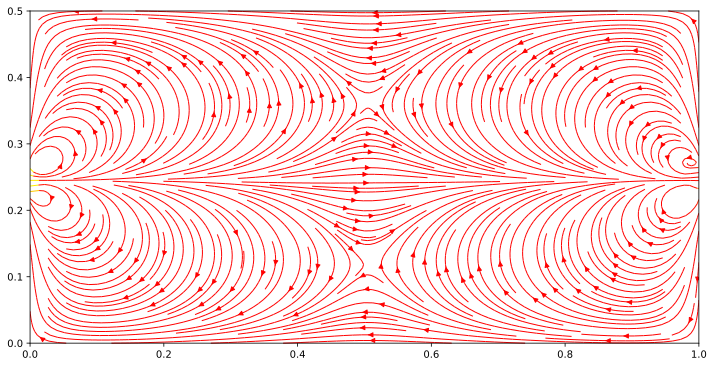

In [55]:
x_formesh = np.linspace(0,lx,nx)
y_formesh = np.linspace(0,ly,ny)
xx,yy = np.meshgrid(x_formesh,y_formesh)
nn = 1
fig = plt.figure(figsize=[12,6],dpi=600)
#plt.quiver(xx[::nn,::nn],yy[::nn,::nn],u_center[::nn,::nn],v_center[::nn,::nn])
plt.xlim([xx[0,0],xx[0,-1]])
plt.ylim([yy[0,0],yy[-1,0]])

plt.streamplot(xx,yy,np.float64(u_center), np.float64(v_center), color=np.sqrt(u_center*u_center + v_center*v_center),density=2.5,cmap=plt.cm.autumn,linewidth=1.0)

In [56]:
u_framescc = 0.5*(u_frames[1:-1,2:,:] + u_frames[1:-1,1:-1,:])
v_framescc = 0.5*(v_frames[2:,1:-1,:] + v_frames[1:-1,1:-1,:])


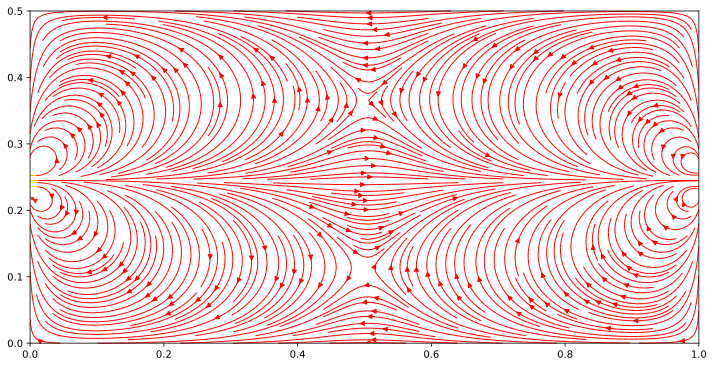

In [57]:

fig = plt.figure(figsize=[12,6],dpi=600)
#plt.xlim([xx[0,0],xx[0,-1]])
#plt.ylim([yy[0,0],yy[-1,0]])

def animate(i):
    fig.clear()
    plt.xlim([xx[0,0],xx[0,-1]])
    plt.ylim([yy[0,0],yy[-1,0]])

    return plt.streamplot(xx,yy,np.float64(u_framescc[:,:,i]), np.float64(v_framescc[:,:,i]), color=np.sqrt(u_center*u_center + v_center*v_center),density=3,cmap=plt.cm.autumn,linewidth=1.0)


anim = animation.FuncAnimation(fig,animate, frames= frames, interval= 400)
anim.save('streamline animation.mp4')

0.1
[0.1, 0.100000000003115607566, 0.10000000000623120958, 0.100000000009346811595, 0.10000000001246241361, 0.100000000015578015624, 0.10000000001869361764, 0.100000000021809219654, 0.10000000002492482167, 0.10000000002804042368, 0.1000000000311560257, 0.10000000003427162771, 0.10000000003738722973, 0.10000000004050283174, 0.100000000043618433756, 0.10000000004673403577, 0.100000000049849637786, 0.1000000000529652398, 0.100000000056080841815, 0.10000000005919644383, 0.100000000062312045844, 0.10000000006542764786, 0.100000000068543249874, 0.10000000007165885189, 0.1000000000747744539, 0.10000000007789005592, 0.10000000008100565793, 0.10000000008412125995, 0.10000000008723686196, 0.100000000090352463976, 0.10000000009346806599, 0.100000000096583668006, 0.10000000009969927002, 0.100000000102814872035, 0.10000000010593047405, 0.100000000109046076064, 0.10000000011216167808, 0.100000000115277280094, 0.10000000011839288211, 0.10000000012150848412, 0.10000000012462408614, 0.10000000012773968

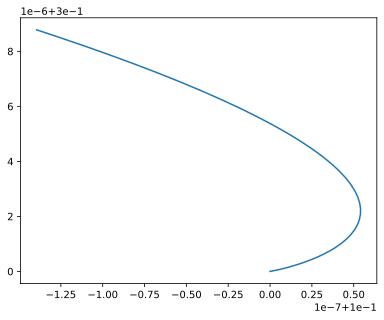

In [71]:
#function that takes in u_framescc, v_framescc, x0, y0 and outputs x_line and y_line which are the coordinates of the lines
#at increasing times.

def pathline(u_framescc,v_framescc, x0, y0, tau_ratio):
    x = x0
    y = y0

    x_line = []
    y_line = []
    for f in range(frames):

        for k in range(tau_ratio):
            
            #boundry conditions
            if x < 0.0:
                x = 0.01
            elif x > lx:
                x = lx - 0.01

            if y < 0.0:
                y = 0.01
            elif y > lx:
                x = ly - 0.01
            
            i = round(y/dy) #between 0-99
            j = round(x/dx) #between 0-199
            
            #print("i =", i)
            #print(x)
            #x_line.append(x)
            #y_line.append(y)

            #g = u_framescc[i, j, f]*(dt/tau_ratio)
            if 0.0 <= x <= lx :
                x_line.append(x)

                x += u_framescc[i, j, f]*(dt/tau_ratio)
            
            if 0 <= y <= ly :
                y_line.append(y)
                y += v_framescc[i, j, f]*(dt/tau_ratio)


    return x_line, y_line
        

linex0, liney0 = pathline(u_framescc, v_framescc, 0.1, 0.3, 1000) #x= 0.0-0.99, y=0.0-0.49
fig, ax = plt.subplots()
ax.plot(linex0,liney0)

print(linex0[0])

#line matrix produces a matrix such that the columns are coordinates for each line. 
xline_matrix = []
yline_matrix = []
for linenum in range(10):

    linexn, lineyn = pathline(u_framescc,v_framescc, 0.1, linenum/40, 500)

    xline_matrix.append(linexn)
    yline_matrix.append(lineyn)

print(linex0)

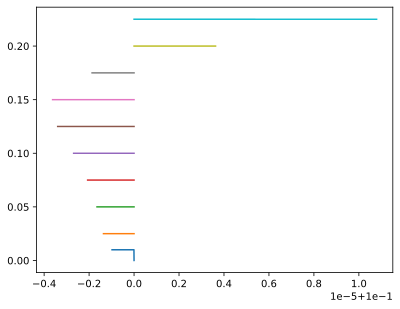

In [72]:
sizes = np.random.uniform(15, 80, len(linex0))
colors = np.random.uniform(15, 80, len(liney0))

# plot
fig, ax = plt.subplots()

#ax.scatter(linex0, liney0, s=sizes, c=colors, vmin=0, vmax=100)

for plots in range(10):
    ax.plot(xline_matrix[plots],yline_matrix[plots])